In [25]:
import numpy as np
import os
from PIL import Image
import pandas as pd
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, LeakyReLU, Dropout, Input, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, load_model
import tensorflow.keras.backend as K
from keras import Input, Model, callbacks
from keras.metrics import Mean
from tensorflow.keras.optimizers import Adam

In [26]:
ROWS = 64
COLS = 64
CHANNELS = 3
IMG_SHAPE = (ROWS, COLS, CHANNELS)
BATCH_SIZE = 128
NOISE_SIZE = 100
EPOCHS = 50
EPOCHS_TO_SAVE = 3

In [27]:
def show_images(images, num_cols, title, filename):
    num_rows = (len(images) - 1) // num_cols + 1
    fig = plt.figure(figsize = (num_cols, num_rows))
    
    for index, img in enumerate(images):
        plt.subplot(num_rows, num_cols, index + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(title)
    
    fig.savefig(filename +".png")
    plt.show()

In [28]:
def load_faces_imgs(num_of_imgs):
    faces_paths = []
    faces_path = os.path.join(os.getcwd(), 'dataset')
    faces_path = os.path.join(faces_path, 'face_imgs')
    c = 0
    
    for path in os.listdir(faces_path):
        if '.jpg' in path:
            faces_paths.append(os.path.join(faces_path, path))
            c += 1
            if c >= num_of_imgs:
                break
    
    crop = (30, 55, 150, 175)
    images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in faces_paths]
    
    for i in range(len(images)):
        images[i] = ((images[i] - images[i].min()) / (255 - images[i].min()))
        
    
    images = np.array(images) 
    return images

In [29]:
def prepare_faces_batch(x_train, batch_size):
    
    dataset = tf.data.Dataset.from_tensor_slices(x_train)
    dataset = dataset.shuffle(1024)
    
    dataset = dataset.batch(batch_size, drop_remainder = True).prefetch(1) 
    
    return dataset

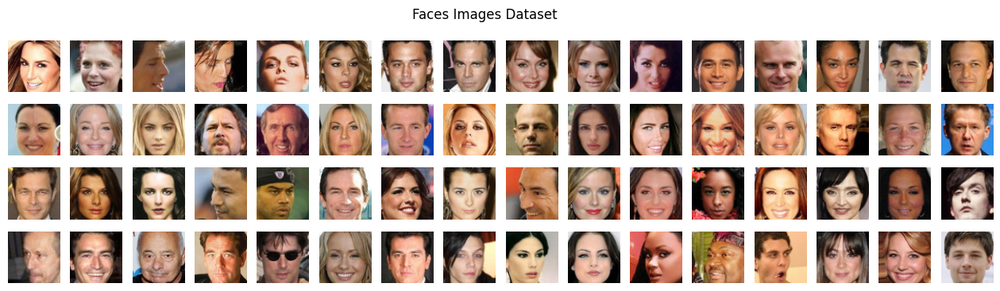

In [30]:
faces = load_faces_imgs(50000)
show_images(faces[0:64], 16, 'Faces Images Dataset', 'dataset_imgs')

In [31]:
def build_generator(): 
    return keras.models.Sequential([ 
    Dense(4 * 4 * 512, input_shape=[NOISE_SIZE]),
    BatchNormalization(),
    LeakyReLU(alpha = 0.2),
    Reshape([4, 4, 512]),
    
    Conv2DTranspose(256, kernel_size = 4, strides = 2, padding = 'same'), 
    BatchNormalization(momentum = 0.8), 
    LeakyReLU(alpha = 0.2), 
        
    Conv2DTranspose(128, kernel_size = 4, strides = 2, padding = 'same'), 
    BatchNormalization(momentum = 0.8), 
    LeakyReLU(alpha = 0.2), 
    
    Conv2DTranspose(64, kernel_size = 4, strides = 2, padding = 'same'),
    BatchNormalization(momentum = 0.8), 
    LeakyReLU(alpha = 0.2),
    
    Conv2DTranspose(3, kernel_size = 4, strides = 2, padding = 'same', activation = 'sigmoid'),
    
], name = 'generator')

In [32]:
def build_discriminator():
    return keras.models.Sequential([
    
    Conv2D(32, kernel_size = 4, strides = 2, padding = 'same', input_shape = IMG_SHAPE),
    LeakyReLU(alpha = 0.2),
    Dropout(rate = 0.3),  

    Conv2D(64, kernel_size = 4, strides = 2, padding = 'same'),
    LeakyReLU(alpha = 0.2),
    Dropout(rate = 0.3),
    
    Conv2D(128, kernel_size = 4, strides = 2, padding = 'same'),     
    LeakyReLU(alpha = 0.2), 
    Dropout(rate = 0.3), 
      
    Conv2D(256, kernel_size = 4, strides = 2, padding = 'same'),     
    LeakyReLU(alpha = 0.2), 
    Dropout(rate = 0.3),
        
    Flatten(),
    Dense(1, activation = 'sigmoid')
], name = 'discriminator')

In [33]:
class DCGAN(Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, discriminator_optimizer, generator_optimizer, loss_fn):
        super().compile()
        self.discriminator_optimizer = discriminator_optimizer
        self.generator_optimizer = generator_optimizer
        self.loss_fn = loss_fn
        self.discriminator_loss_metric = Mean(name = "discriminator_loss")
        self.generator_loss_metric = Mean(name = "generator_loss")

    @property
    def metrics(self):
        return [self.discriminator_loss_metric, self.generator_loss_metric]

    def train_step(self, real_images):
        
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape = (batch_size, self.latent_dim))
        
        generated_images = self.generator(random_latent_vectors)
        combined_images = tf.concat([generated_images, real_images], axis = 0)
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis = 0
        )
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            discriminator_loss = self.loss_fn(labels, predictions)
        gradients = tape.gradient(discriminator_loss, self.discriminator.trainable_weights)
        self.discriminator_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_weights))

        random_latent_vectors = tf.random.normal(shape = (batch_size, self.latent_dim))
        misleading_labels = tf.zeros((batch_size, 1))

        
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            generator_loss = self.loss_fn(misleading_labels, predictions)
        gradients = tape.gradient(generator_loss, self.generator.trainable_weights)
        self.generator_optimizer.apply_gradients(zip(gradients, self.generator.trainable_weights))

        
        self.generator_loss_metric.update_state(generator_loss)
        self.discriminator_loss_metric.update_state(discriminator_loss)
        
        return {
            "discriminator_loss": self.discriminator_loss_metric.result(),
            "generator_loss": self.generator_loss_metric.result(),
        }

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 8192)              827392    
                                                                 
 batch_normalization_16 (Bat  (None, 8192)             32768     
 chNormalization)                                                
                                                                 
 leaky_re_lu_26 (LeakyReLU)  (None, 8192)              0         
                                                                 
 reshape_4 (Reshape)         (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_16 (Conv2D  (None, 8, 8, 256)        2097408   
 Transpose)                                                      
                                                                 
 batch_normalization_17 (Bat  (None, 8, 8, 256)        10

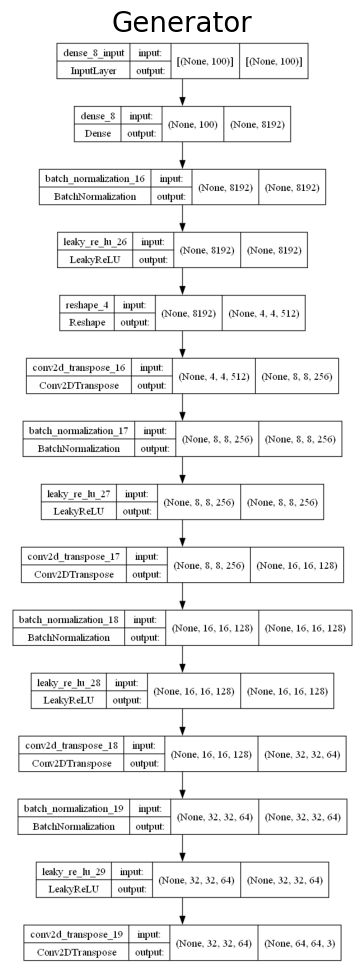

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 32, 32, 32)        1568      
                                                                 
 leaky_re_lu_30 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 dropout_10 (Dropout)        (None, 32, 32, 32)        0         
                                                                 
 conv2d_11 (Conv2D)          (None, 16, 16, 64)        32832     
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 dropout_11 (Dropout)        (None, 16, 16, 64)        0         
                                                                 
 conv2d_12 (Conv2D)          (None, 8, 8, 128)       

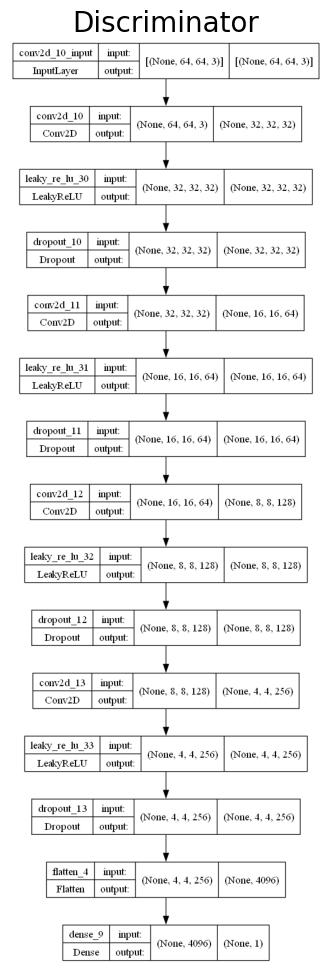

In [34]:
generator = build_generator()
generator.summary()
plot_model(generator, show_shapes = True, expand_nested = True, to_file = 'generator_scheme.png')
fig, ax = plt.subplots(1, 1, figsize = (20, 12))
ax.imshow(plt.imread('generator_scheme.png'))
ax.set_title('Generator', fontsize = 20)
ax.axis('off')
plt.show()

discriminator = build_discriminator()
discriminator.summary()
plot_model(discriminator, show_shapes = True, expand_nested = True, to_file = 'discriminator_scheme.png')
fig, ax = plt.subplots(1, 1, figsize = (20, 12))
ax.imshow(plt.imread('discriminator_scheme.png'))
ax.set_title('Discriminator', fontsize = 20)
ax.axis('off')
plt.show()

In [35]:
class save_imgs(callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if ((int(epoch) + 1) % EPOCHS_TO_SAVE) == 0:
            fake_images = generator(tf.random.normal([64, NOISE_SIZE]))
            show_images(fake_images, 16, 'Images generated after {} epochs'.format(int(epoch) + 1), "gen_imgs_{}".format(int(epoch) + 1))

Epoch 1/50
1563/1563 [==============================] - 284s 181ms/step - discriminator_loss: 0.5780 - generator_loss: 1.2208
Epoch 2/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5796 - generator_loss: 1.3471
Epoch 3/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6093 - generator_loss: 1.1633

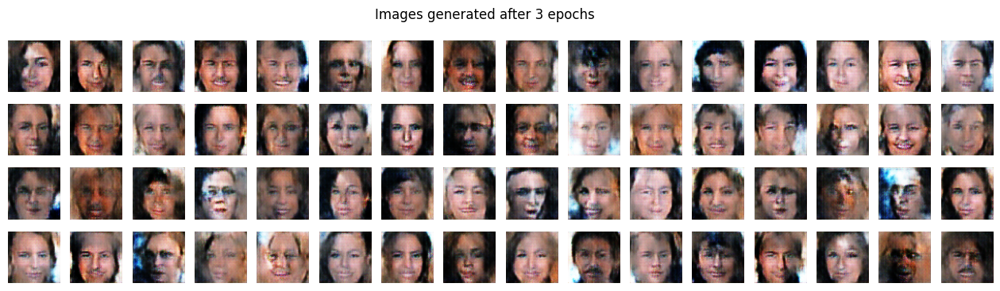

1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.6093 - generator_loss: 1.1633
Epoch 4/50
1563/1563 [==============================] - 280s 179ms/step - discriminator_loss: 0.6189 - generator_loss: 1.0784
Epoch 5/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6350 - generator_loss: 1.0017
Epoch 6/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6462 - generator_loss: 0.9525

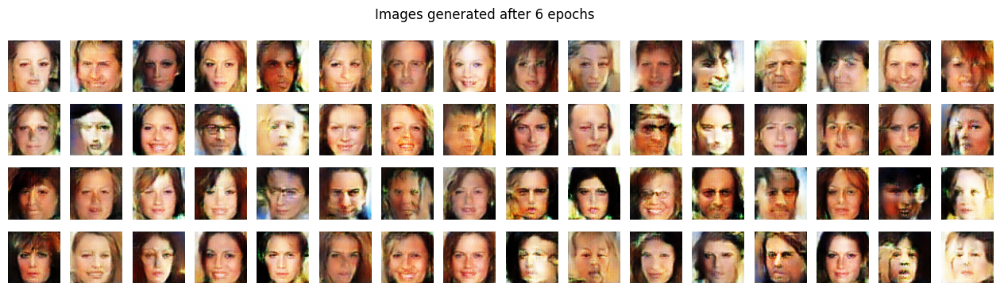

1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6462 - generator_loss: 0.9525
Epoch 7/50
1563/1563 [==============================] - 280s 179ms/step - discriminator_loss: 0.6522 - generator_loss: 0.9159
Epoch 8/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6521 - generator_loss: 0.9157
Epoch 9/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6507 - generator_loss: 0.9133

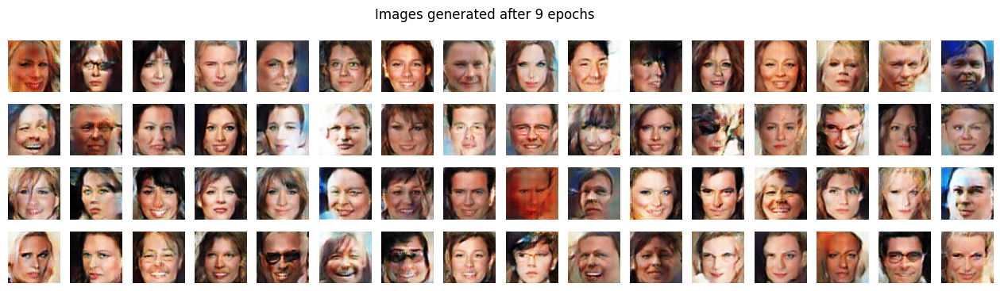

1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.6507 - generator_loss: 0.9133
Epoch 10/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6534 - generator_loss: 0.9012
Epoch 11/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6531 - generator_loss: 0.8999
Epoch 12/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6492 - generator_loss: 0.9006

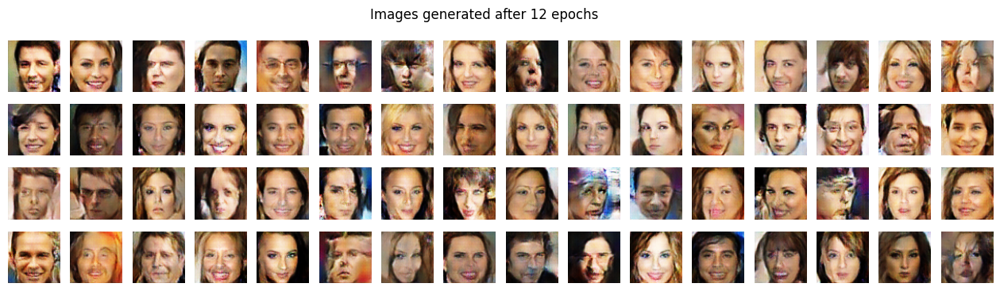

1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.6492 - generator_loss: 0.9006
Epoch 13/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.6509 - generator_loss: 0.9019
Epoch 14/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.6452 - generator_loss: 0.9052
Epoch 15/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6467 - generator_loss: 0.9090

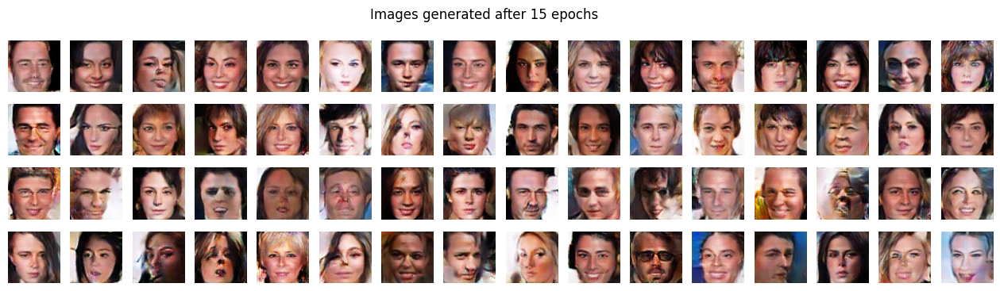

1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.6467 - generator_loss: 0.9090
Epoch 16/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6427 - generator_loss: 0.9142
Epoch 17/50
1563/1563 [==============================] - 285s 182ms/step - discriminator_loss: 0.6405 - generator_loss: 0.9212
Epoch 18/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6380 - generator_loss: 0.9258

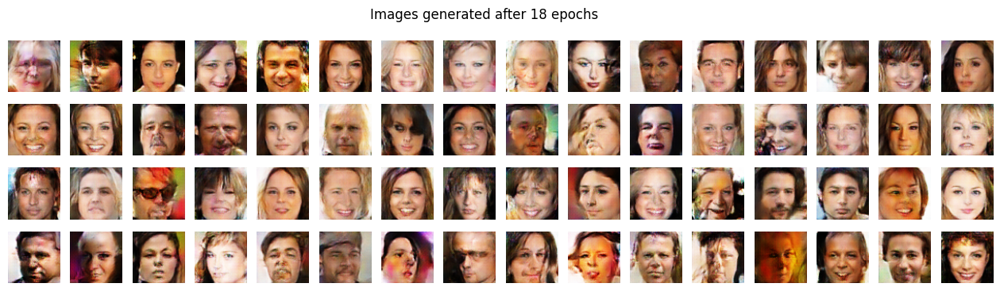

1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6380 - generator_loss: 0.9258
Epoch 19/50
1563/1563 [==============================] - 280s 179ms/step - discriminator_loss: 0.6362 - generator_loss: 0.9281
Epoch 20/50
1563/1563 [==============================] - 280s 179ms/step - discriminator_loss: 0.6339 - generator_loss: 0.9360
Epoch 21/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6325 - generator_loss: 0.9416

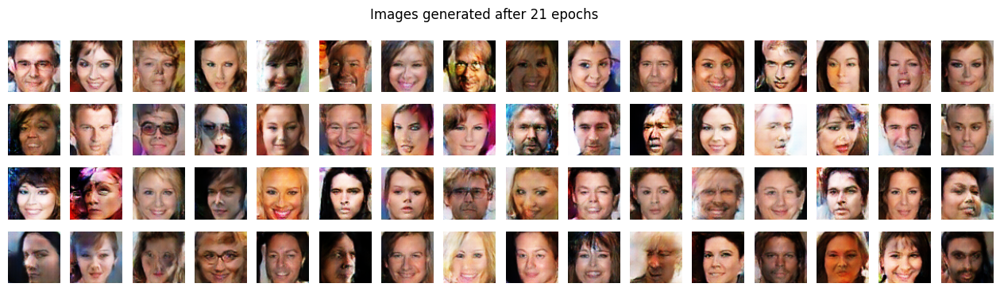

1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6325 - generator_loss: 0.9416
Epoch 22/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6295 - generator_loss: 0.9441
Epoch 23/50
1563/1563 [==============================] - 280s 179ms/step - discriminator_loss: 0.6284 - generator_loss: 0.9486
Epoch 24/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6253 - generator_loss: 0.9581

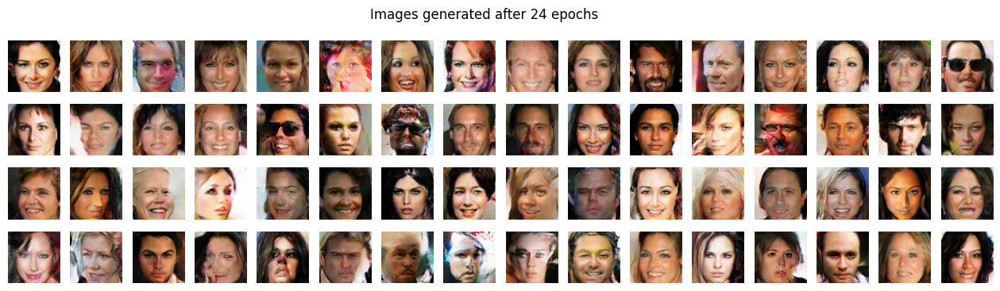

1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.6253 - generator_loss: 0.9581
Epoch 25/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6211 - generator_loss: 0.9729
Epoch 26/50
1563/1563 [==============================] - 281s 179ms/step - discriminator_loss: 0.6185 - generator_loss: 0.9755
Epoch 27/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6153 - generator_loss: 0.9844

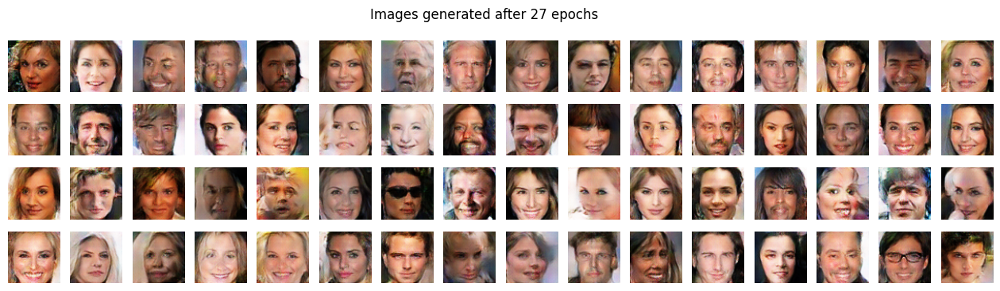

1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.6153 - generator_loss: 0.9844
Epoch 28/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6132 - generator_loss: 0.9922
Epoch 29/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.6098 - generator_loss: 0.9998
Epoch 30/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.6059 - generator_loss: 1.0121

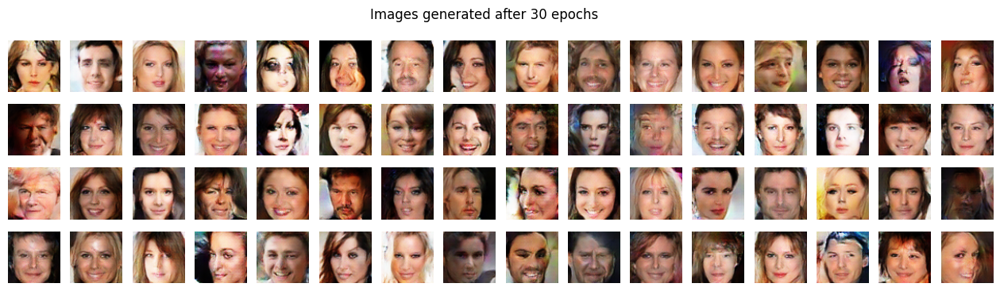

1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.6059 - generator_loss: 1.0121
Epoch 31/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.6033 - generator_loss: 1.0256
Epoch 32/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5980 - generator_loss: 1.0317
Epoch 33/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5949 - generator_loss: 1.0434

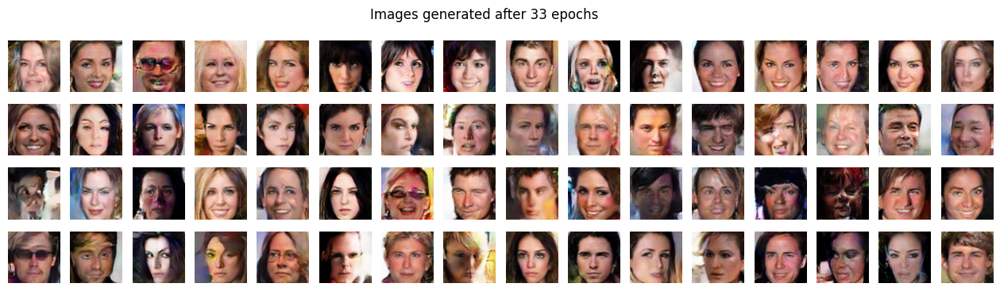

1563/1563 [==============================] - 284s 181ms/step - discriminator_loss: 0.5949 - generator_loss: 1.0434
Epoch 34/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5922 - generator_loss: 1.0557
Epoch 35/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5873 - generator_loss: 1.0707
Epoch 36/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5847 - generator_loss: 1.0727

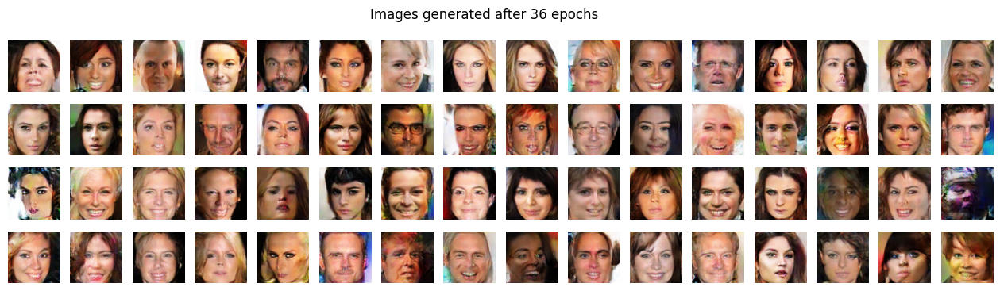

1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.5847 - generator_loss: 1.0727
Epoch 37/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.5769 - generator_loss: 1.0946
Epoch 38/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.5768 - generator_loss: 1.1012
Epoch 39/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5737 - generator_loss: 1.1134

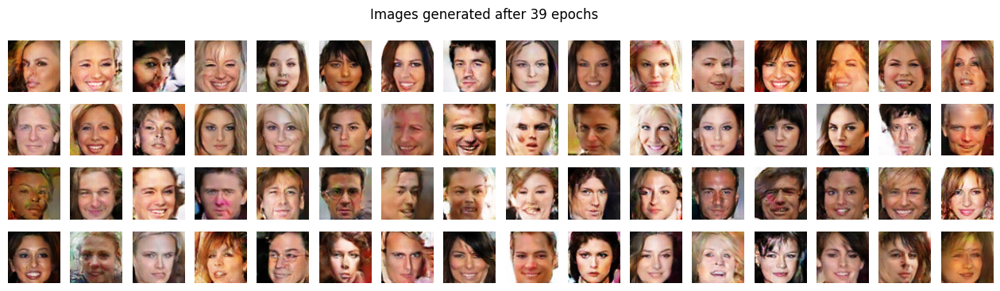

1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5737 - generator_loss: 1.1134
Epoch 40/50
1563/1563 [==============================] - 281s 180ms/step - discriminator_loss: 0.5668 - generator_loss: 1.1361
Epoch 41/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5625 - generator_loss: 1.1431
Epoch 42/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5585 - generator_loss: 1.1585

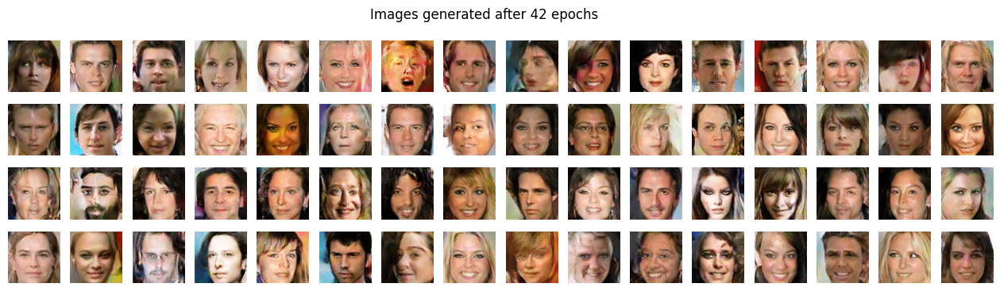

1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5585 - generator_loss: 1.1585
Epoch 43/50
1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.5547 - generator_loss: 1.1746
Epoch 44/50
1563/1563 [==============================] - 282s 181ms/step - discriminator_loss: 0.5509 - generator_loss: 1.1858
Epoch 45/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5475 - generator_loss: 1.1983

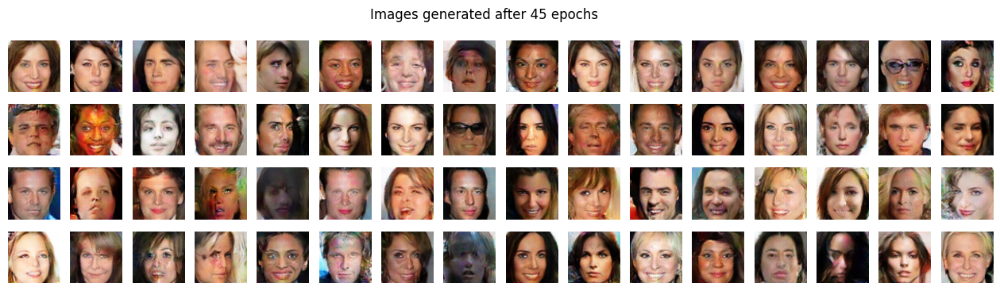

1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5475 - generator_loss: 1.1983
Epoch 46/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5434 - generator_loss: 1.2131
Epoch 47/50
1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5402 - generator_loss: 1.2346
Epoch 48/50
1563/1563 [==============================] - ETA: 0s - discriminator_loss: 0.5340 - generator_loss: 1.2434

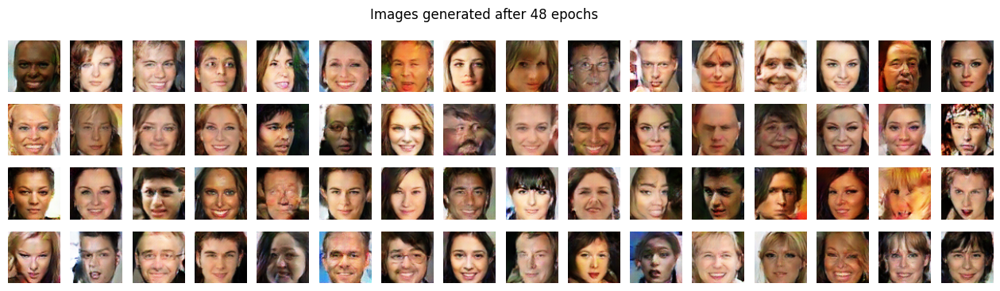

1563/1563 [==============================] - 282s 180ms/step - discriminator_loss: 0.5340 - generator_loss: 1.2434
Epoch 49/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5311 - generator_loss: 1.2583
Epoch 50/50
1563/1563 [==============================] - 283s 181ms/step - discriminator_loss: 0.5262 - generator_loss: 1.2768


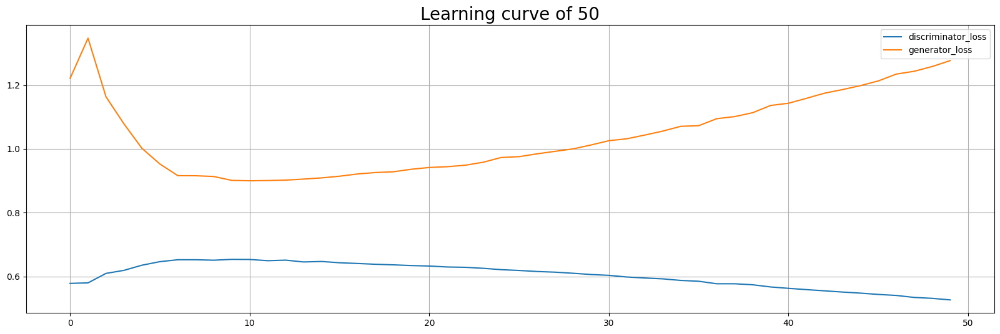

In [36]:
dataset = prepare_faces_batch(faces, BATCH_SIZE)

generator = build_generator() 
discriminator = build_discriminator()
    
gan = DCGAN(
    discriminator = discriminator, generator=generator, 
    latent_dim = NOISE_SIZE
)
    
gan.compile(
    discriminator_optimizer = Adam(0.0002, 0.5),
    generator_optimizer = Adam(0.0002, 0.5),
    loss_fn = keras.losses.BinaryCrossentropy(),
)
    
history = gan.fit(faces, epochs = EPOCHS, verbose=1, callbacks = [save_imgs()])

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_title('Learning curve of {}'.format(EPOCHS), fontsize = 20)
pd.DataFrame(history.history).plot(ax = ax)
ax.grid()
       
generator.save('faces_dcgan_{}.h5'.format(EPOCHS))

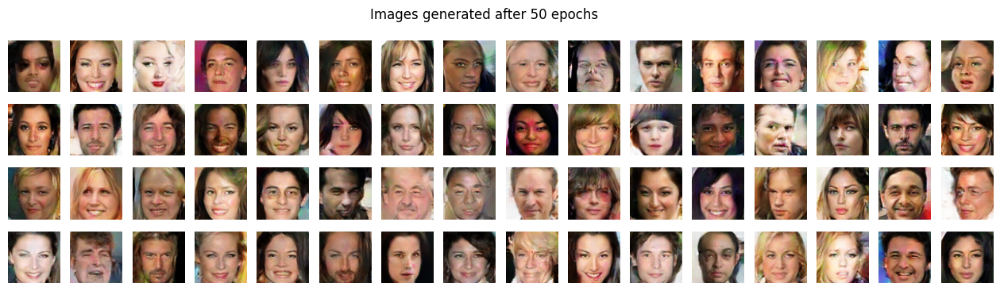

In [37]:
generator = load_model('faces_dcgan_{}.h5'.format(EPOCHS), compile = False)
fake_images = generator(tf.random.normal([64, NOISE_SIZE]))
show_images(fake_images, 16, 'Images generated after {} epochs'.format(EPOCHS), "res_gen_imgs_{}".format(EPOCHS))